In [1]:
import os
DATA_DIR = 'C:/Users/user/Desktop/anomaly_detection/anomalib'

# load repo with data if it is not exists
if not os.path.exists(DATA_DIR):
    !git clone https://github.com/openvinotoolkit/anomalib.git
    %cd anomalib
    !pip install -e . -q


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os, pprint, yaml, warnings, math, glob, cv2, random, logging

def warn(*args, **kwargs):
    pass
warnings.warn = warn
warnings.filterwarnings('ignore')
logger = logging.getLogger("anomalib")

import anomalib
from pytorch_lightning import Trainer, seed_everything
from anomalib.config import get_configurable_parameters
from anomalib.data import get_datamodule
from anomalib.models import get_model
from anomalib.utils.callbacks import LoadModelCallback, get_callbacks
from anomalib.utils.loggers import configure_logger, get_experiment_logger

import torch
print(torch.__version__)
print(torch.version.cuda)
print(torch.backends.cudnn.version())
print(torch.cuda.is_available())
print(torch.cuda.device_count())      
print(torch.cuda.current_device())
print(torch.cuda.device(0))
print(torch.cuda.get_device_name(0))

OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.


1.12.1+cu113
11.3
8302
True
1
0
NVIDIA GeForce RTX 3090 Ti


In [3]:
CONFIG_PATHS = 'C:/Users/user/Desktop/anomaly_detection/anomalib/src/anomalib/models'
MODEL_CONFIG_PAIRS = {
    'patchcore': f'{CONFIG_PATHS}/patchcore/config.yaml',
    'padim':     f'{CONFIG_PATHS}/padim/config.yaml',
    'cflow':     f'{CONFIG_PATHS}/cflow/config.yaml',
    'dfkde':     f'{CONFIG_PATHS}/dfkde/config.yaml',
    'dfm':       f'{CONFIG_PATHS}/dfm/config.yaml',
    'ganomaly':  f'{CONFIG_PATHS}/ganomaly/config.yaml',
    'stfpm':     f'{CONFIG_PATHS}/stfpm/config.yaml',
    'fastflow':  f'{CONFIG_PATHS}/fastflow/config.yaml',
    'draem':     f'{CONFIG_PATHS}/draem/config.yaml',
    'reverse_distillation': f'{CONFIG_PATHS}/reverse_distillation/config.yaml',
}

In [4]:
MODEL = 'padim' # 'padim', 'cflow', 'stfpm', 'ganomaly', 'dfkde', 'patchcore'
print(open(os.path.join(MODEL_CONFIG_PAIRS[MODEL]), 'r').read())

dataset:
    name: raphas_v2    
    format: folder
    root: C:/Users/user/Downloads/DRAEM-main/DRAEM-main/mvtec_anomaly_detection/mvtec_anomaly_detection/raphas_v2
    normal_dir: good # name of the folder containing normal images.
    abnormal_dir: bad # name of the folder containing abnormal images.
    task: classification # classification or segmentation
    mask_dir: null #optional
    normal_test_dir: null # optional
    extensions: null
    split_ratio: 0.2  # normal images ratio to create a test split
    seed: 0
    image_size: 256
    train_batch_size: 32
    eval_batch_size: 32
    num_workers: 8
    normalization: imagenet # data distribution to which the images will be normalized
    test_split_mode: from_dir # options [from_dir, synthetic]
    test_split_ratio: 0.2
    val_split_ratio: 0.5 # fraction of train/test images held out for validation (usage depends on val_split_mode)
    transform_config:
        train: null
        eval: null
    val_split_mode: from_test # 

In [5]:
new_update = {
    "path": 'C:/Users/user/Downloads/DRAEM-main/DRAEM-main/mvtec_anomaly_detection/mvtec_anomaly_detection',
    'category': 'raphas_v2', 
    'image_size': 256,
    'train_batch_size':48,
    'seed': 101
}

In [6]:
# update yaml key's value
def update_yaml(old_yaml, new_yaml, new_update):
    # load yaml
    with open(old_yaml) as f:
        old = yaml.safe_load(f)
                  
    temp = []
    def set_state(old, key, value):
        if isinstance(old, dict):
            for k, v in old.items():
                if k == 'project':
                    temp.append(k)
                if k == key:
                    if temp and k == 'path':
                        # right now, we don't wanna change `project.path`
                        continue
                    old[k] = value
                elif isinstance(v, dict):
                    set_state(v, key, value)
    
    # iterate over the new update key-value pari
    for key, value in new_update.items():
        set_state(old, key, value)
    
    # save the updated / modified yaml file
    with open(new_yaml, 'w') as f:
        yaml.safe_dump(old, f, default_flow_style=False)

In [7]:
# let's set a new path location of new config file 
new_yaml_path = CONFIG_PATHS + '/' + list(MODEL_CONFIG_PAIRS.keys())[0] + '_new.yaml'

# run the update yaml method to update desired key's values
update_yaml(MODEL_CONFIG_PAIRS[MODEL], new_yaml_path, new_update)

In [8]:
with open(new_yaml_path) as f:
    updated_config = yaml.safe_load(f)
pprint.pprint(updated_config) # check if it's updated

{'dataset': {'abnormal_dir': 'bad',
             'eval_batch_size': 32,
             'extensions': None,
             'format': 'folder',
             'image_size': 256,
             'mask_dir': None,
             'name': 'raphas_v2',
             'normal_dir': 'good',
             'normal_test_dir': None,
             'normalization': 'imagenet',
             'num_workers': 8,
             'root': 'C:/Users/user/Downloads/DRAEM-main/DRAEM-main/mvtec_anomaly_detection/mvtec_anomaly_detection/raphas_v2',
             'seed': 101,
             'split_ratio': 0.2,
             'task': 'classification',
             'test_split_mode': 'from_dir',
             'test_split_ratio': 0.2,
             'tiling': {'apply': False,
                        'random_tile_count': 16,
                        'remove_border_count': 0,
                        'stride': None,
                        'tile_size': None,
                        'use_random_tiling': False},
             'train_batch_size': 48,

In [9]:
if updated_config['project']['seed'] != 0:
    print(updated_config['project']['seed'])
    seed_everything(updated_config['project']['seed'])

Global seed set to 101


101


In [10]:
# It will return the configurable parameters in DictConfig object.
config = get_configurable_parameters(
    model_name=updated_config['model']['name'],
    config_path=new_yaml_path
)


In [11]:
# pass the config file to model, logger, callbacks and datamodule
model      = get_model(config)
experiment_logger = get_experiment_logger(config)
callbacks  = get_callbacks(config)
datamodule = get_datamodule(config)

FeatureExtractor is deprecated. Use TimmFeatureExtractor instead. Both FeatureExtractor and TimmFeatureExtractor will be removed in a future release.


In [12]:
# start training
trainer = Trainer(**config.trainer, logger=experiment_logger, callbacks=callbacks)
trainer.fit(model=model, datamodule=datamodule)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
`Trainer(limit_test_batches=1.0)` was configured so 100% of the batches will be used..
`Trainer(limit_predict_batches=1.0)` was configured so 100% of the batches will be used..
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..


You are using a CUDA device ('NVIDIA GeForce RTX 3090 Ti') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                  | Type                     | Params
-------------------------------------------------------------------
0 | image_threshold       | AnomalyScoreThreshold    | 0     
1 | pixel_threshold       | AnomalyScoreThreshold    | 0     
2 | model                 | PadimModel               | 2.8 M 
3 | image_metrics         | AnomalibMetricCollection | 0     
4 | pixel_metrics         | AnomalibMetricCollection | 0     
5 | normalization_metrics | MinMax                   | 0     
-------------------------------------------------------------------
2.8 M     Trainable 

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=2` reached.


In [13]:
# load best model from checkpoint before evaluating
load_model_callback = LoadModelCallback(
    weights_path=trainer.checkpoint_callback.best_model_path
)
trainer.callbacks.insert(0, load_model_callback)
trainer.test(model=model, datamodule=datamodule)

You are using a CUDA device ('NVIDIA GeForce RTX 3090 Ti') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │            0.0            │
│       image_F1Score       │    0.8499999642372131     │
└───────────────────────────┴───────────────────────────┘

[{'image_F1Score': 0.8499999642372131, 'image_AUROC': 0.0}]

In [14]:
RESULT_PATH = os.path.join(
    updated_config['project']['path'],
    updated_config['model']['name'],
    updated_config['dataset']['format'], 
    #updated_config['dataset']['category']
)
RESULT_PATH

RESULT_PATH = './results/padim/raphas_v2/run/'  #'./results/padim/mvtec/hazelnut/run'

RESULT_PATH

'./results/padim/raphas_v2/run/'

In [15]:
# a simple function to visualize the model's prediction (anomaly heatmap)
def vis(paths, n_images, is_random=True, figsize=(16, 16)):
    for i in range(n_images):
        image_name = paths[i]
        if is_random: image_name = random.choice(paths)
        img = cv2.imread(image_name)[:,:,::-1]
        
        category_type = image_name.split('/')[-4:-3:][0]
        defected_type = image_name.split('/')[-2:-1:][0]
        
        plt.figure(figsize=figsize)
        plt.imshow(img)
        plt.title(
            f"Category : {category_type} and Defected Type : {defected_type}", 
            fontdict={'fontsize': 20, 'fontweight': 'medium'}
        )
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
    plt.show()


In [18]:
for content in os.listdir(RESULT_PATH):
    if content == 'images':
        full_path = glob.glob(os.path.join(RESULT_PATH, content, '**',  '*.bmp'), recursive=True)
        print('Total Image ', len(full_path))
        print(full_path[0].split('/'))
        print(full_path[0].split('/')[-2:-1:])
        print(full_path[0].split('/')[-4:-3:])

Total Image  23
['.', 'results', 'padim', 'raphas_v2', 'run', 'images\\a\\a_001.bmp']
['run']
['padim']


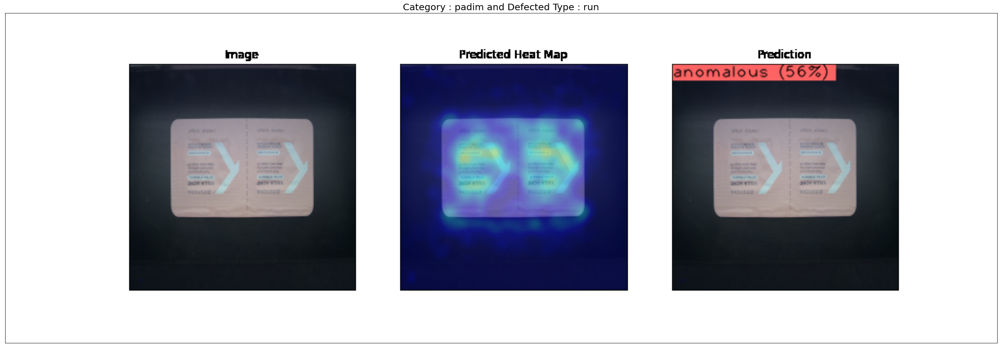

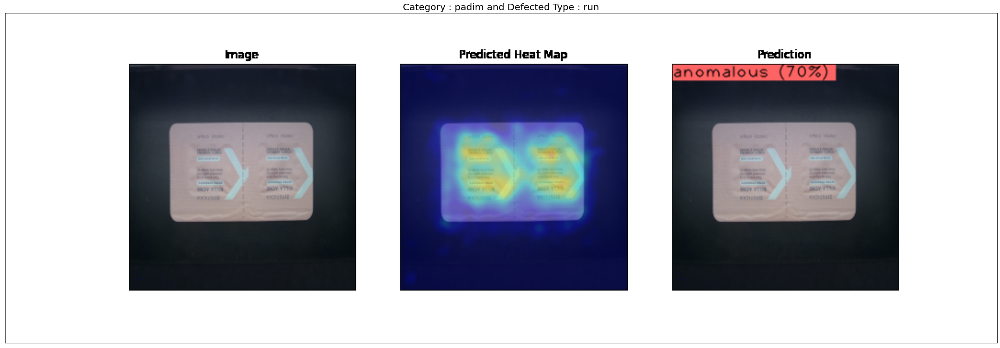

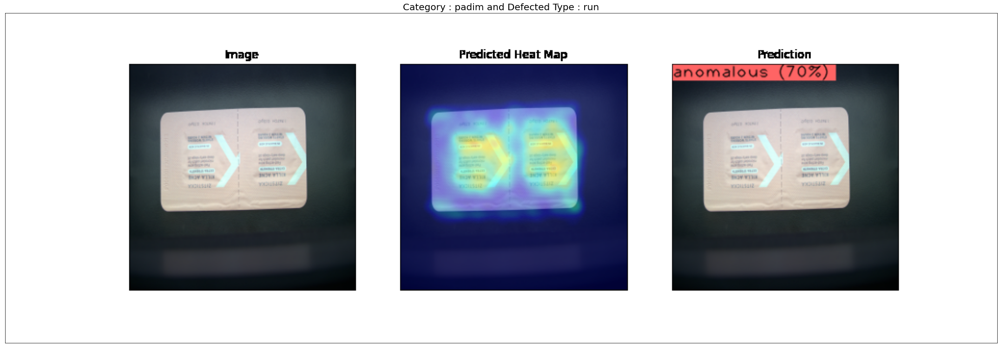

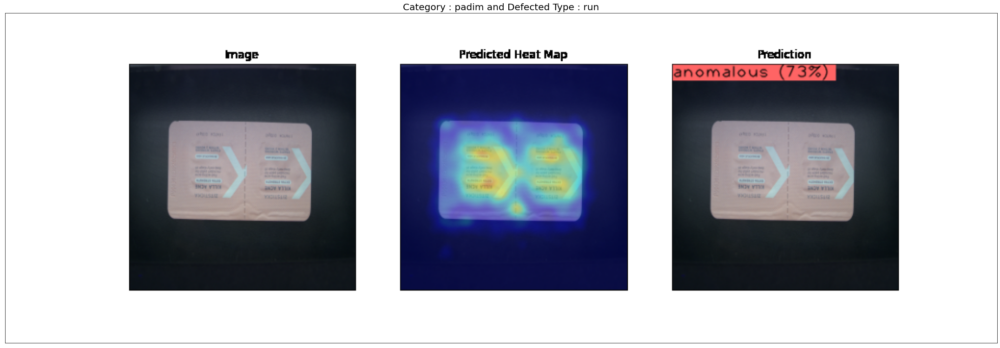

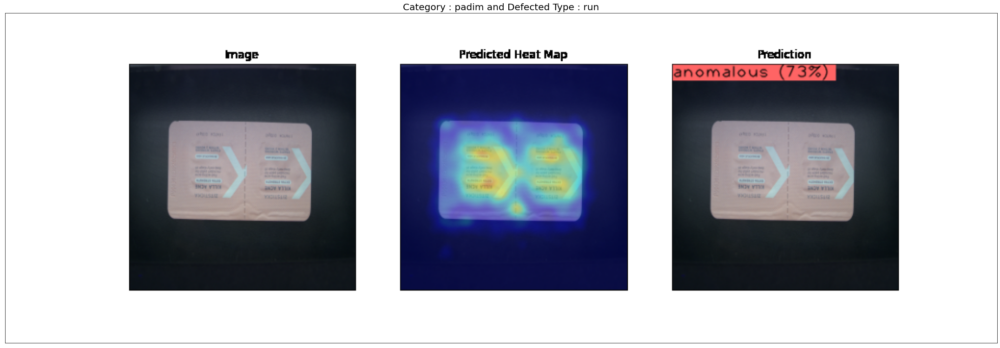

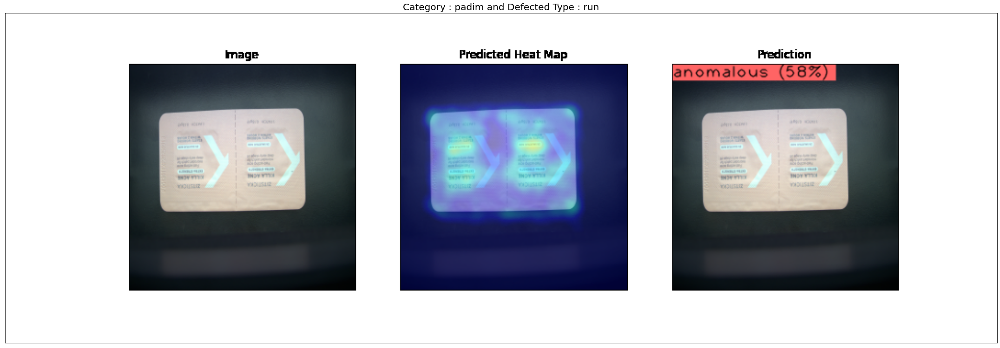

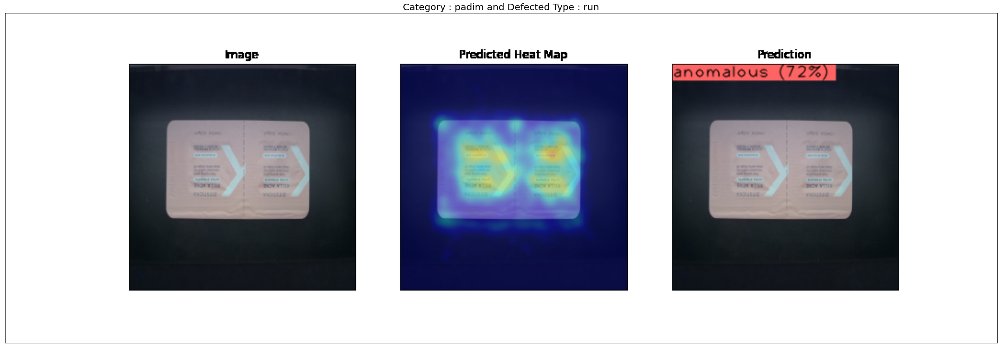

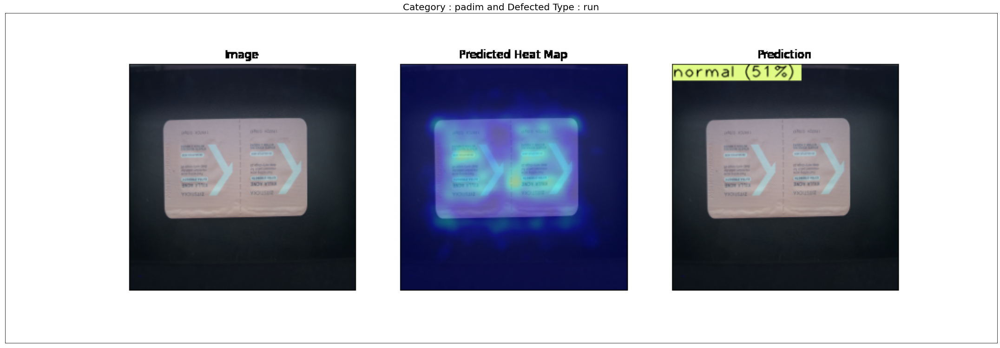

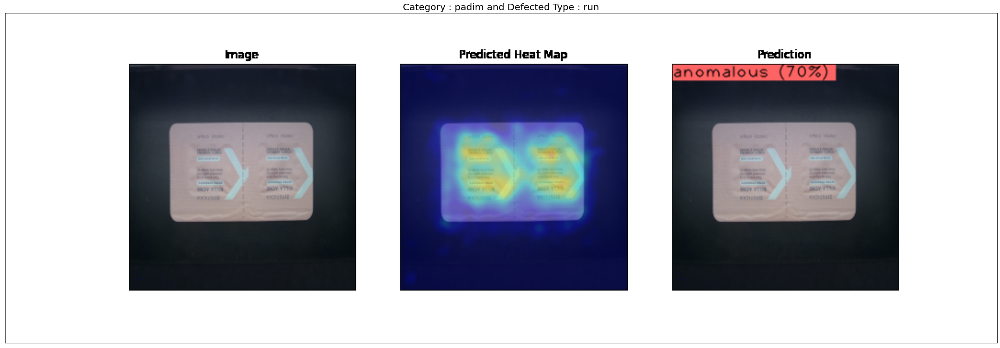

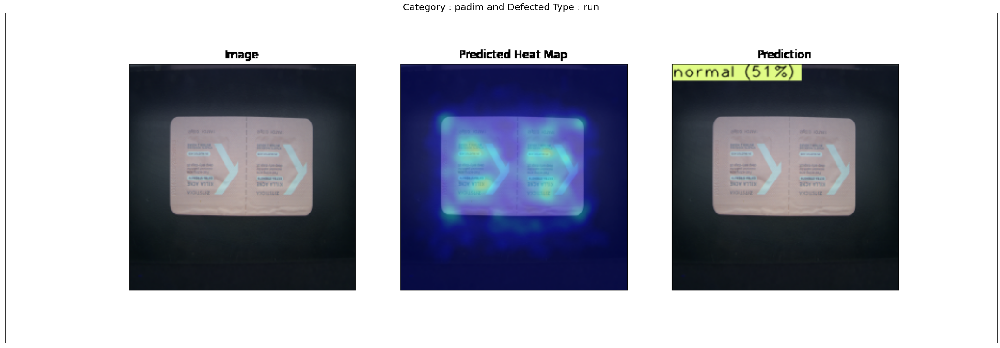

['./results/padim/raphas_v2/run/images\\a\\a_001.bmp', './results/padim/raphas_v2/run/images\\a\\a_002.bmp', './results/padim/raphas_v2/run/images\\a\\a_005.bmp', './results/padim/raphas_v2/run/images\\i\\i_001.bmp', './results/padim/raphas_v2/run/images\\i\\i_002.bmp', './results/padim/raphas_v2/run/images\\i\\i_003.bmp', './results/padim/raphas_v2/run/images\\i\\i_004.bmp', './results/padim/raphas_v2/run/images\\i\\i_005.bmp', './results/padim/raphas_v2/run/images\\i\\i_007.bmp', './results/padim/raphas_v2/run/images\\i\\i_011.bmp', './results/padim/raphas_v2/run/images\\i\\i_013.bmp', './results/padim/raphas_v2/run/images\\i\\i_014.bmp', './results/padim/raphas_v2/run/images\\i\\i_017.bmp', './results/padim/raphas_v2/run/images\\i\\i_022.bmp', './results/padim/raphas_v2/run/images\\i\\i_023.bmp', './results/padim/raphas_v2/run/images\\i\\ok 3.bmp', './results/padim/raphas_v2/run/images\\i\\ok1.bmp', './results/padim/raphas_v2/run/images\\s\\s_001.bmp', './results/padim/raphas_v2/run

In [19]:
vis(full_path, 10, is_random=True, figsize=(30, 30))
print(full_path)

In [20]:
###############new

img_paths = 'C:/Users/user/Downloads/DRAEM-main/DRAEM-main/mvtec_anomaly_detection/mvtec_anomaly_detection/raphas_v2/'



In [22]:
#print(config.dataset.path)
#img_paths = '{}/{}/{}/'.format(config.dataset.path, config.dataset.category, 'test')
#print('img_paths', img_paths)


list = []
for item in os.listdir(img_paths):
    sub_folder = os.path.join(img_paths, item)
    if not "not" in sub_folder:
        img_paths_ = os.listdir(sub_folder)
        #print(img_paths_)
        
        for filename in img_paths_:
            img_paths__ = sub_folder+ '/' + filename
            
            list.append(img_paths__)
            

file_count = len(list)
print(file_count)
print(list)


7
['C:/Users/user/Downloads/DRAEM-main/DRAEM-main/mvtec_anomaly_detection/mvtec_anomaly_detection/raphas_v2/bad/a', 'C:/Users/user/Downloads/DRAEM-main/DRAEM-main/mvtec_anomaly_detection/mvtec_anomaly_detection/raphas_v2/bad/i', 'C:/Users/user/Downloads/DRAEM-main/DRAEM-main/mvtec_anomaly_detection/mvtec_anomaly_detection/raphas_v2/bad/s', 'C:/Users/user/Downloads/DRAEM-main/DRAEM-main/mvtec_anomaly_detection/mvtec_anomaly_detection/raphas_v2/good/ok_001.bmp', 'C:/Users/user/Downloads/DRAEM-main/DRAEM-main/mvtec_anomaly_detection/mvtec_anomaly_detection/raphas_v2/good/ok_002.bmp', 'C:/Users/user/Downloads/DRAEM-main/DRAEM-main/mvtec_anomaly_detection/mvtec_anomaly_detection/raphas_v2/good/ok_003.bmp', 'C:/Users/user/Downloads/DRAEM-main/DRAEM-main/mvtec_anomaly_detection/mvtec_anomaly_detection/raphas_v2/good/ok_004.bmp']


In [23]:
import os
infer_resutls = "C:/Users/user/Desktop/anomaly_detection/infer_results___defect"
os.makedirs(infer_resutls, exist_ok=True)

In [24]:
from _sqlite3 import *

In [ ]:
#for infer_img_path in list:
#    !python C:/Users/user/Desktop/anomaly_detection/anomalib/tools/inference/lightning_inference.py --config C:/Users/user/Desktop/anomaly_detection/results/padim/raphas/run/config.yaml --weights C:/Users/user/Desktop/anomaly_detection/results/padim/raphas/run/weights/lightning/model-v1.ckpt --input {infer_img_path} --output ./infer_results --task "classification"#############$$$$$$$$$$$$$$$$$$########################


In [25]:
for infer_img_path in list:
    #!python C:/Users/user/Desktop/anomaly_detection/anomalib/tools/inference/lightning_inference.py --config C:/Users/user/Desktop/anomaly_detection/results/padim/raphas/run/config.yaml --weights C:/Users/user/Desktop/anomaly_detection/results/padim/raphas/run/weights/lightning/model-v3.ckpt --input {infer_img_path} --output {infer_resutls}
    !python C:/Users/user/Desktop/anomaly_detection/anomalib/tools/inference/lightning_inference.py --config C:/Users/user/Desktop/anomaly_detection/results/padim/raphas_v2/run/config.yaml --weights C:/Users/user/Desktop/anomaly_detection/results/padim/raphas_v2/run/weights/lightning/model-v3.ckpt --input {infer_img_path} --output {infer_resutls}



Predicting: 0it [00:00, ?it/s]
Predicting DataLoader 0: 100%|██████████| 8/8 [00:04<00:00,  1.96it/s]


OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
C:\Users\user\Desktop\anomaly_detection\anomalib\src\anomalib\config\config.py:280: UserWarning: config.project.unique_dir is set to False. This does not ensure that your results will be written in an empty directory and you may overwrite files.
  warn(
c:\dev\envs\gpu_use_test\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `PrecisionRecallCurve` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
FeatureExtractor is deprecated. Use TimmFeatureExtractor instead. Both FeatureExtractor and TimmFeatureExtractor will be removed in a future release.
C:\Users\user\Desktop\anomaly_detection\anomalib\src\anomalib\utils\callbacks\__init__.py:153: UserWarning: Export option: None not found. Defaulting to no model export
  warn


Predicting: 0it [00:00, ?it/s]
Predicting DataLoader 0: 100%|██████████| 25/25 [00:10<00:00,  2.48it/s]


OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
C:\Users\user\Desktop\anomaly_detection\anomalib\src\anomalib\config\config.py:280: UserWarning: config.project.unique_dir is set to False. This does not ensure that your results will be written in an empty directory and you may overwrite files.
  warn(
c:\dev\envs\gpu_use_test\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `PrecisionRecallCurve` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
FeatureExtractor is deprecated. Use TimmFeatureExtractor instead. Both FeatureExtractor and TimmFeatureExtractor will be removed in a future release.
C:\Users\user\Desktop\anomaly_detection\anomalib\src\anomalib\utils\callbacks\__init__.py:153: UserWarning: Export option: None not found. Defaulting to no model export
  warn


Predicting: 0it [00:00, ?it/s]
Predicting DataLoader 0: 100%|██████████| 13/13 [00:05<00:00,  2.19it/s]


OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
C:\Users\user\Desktop\anomaly_detection\anomalib\src\anomalib\config\config.py:280: UserWarning: config.project.unique_dir is set to False. This does not ensure that your results will be written in an empty directory and you may overwrite files.
  warn(
c:\dev\envs\gpu_use_test\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `PrecisionRecallCurve` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
FeatureExtractor is deprecated. Use TimmFeatureExtractor instead. Both FeatureExtractor and TimmFeatureExtractor will be removed in a future release.
C:\Users\user\Desktop\anomaly_detection\anomalib\src\anomalib\utils\callbacks\__init__.py:153: UserWarning: Export option: None not found. Defaulting to no model export
  warn


Predicting: 0it [00:00, ?it/s]
Predicting DataLoader 0: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
C:\Users\user\Desktop\anomaly_detection\anomalib\src\anomalib\config\config.py:280: UserWarning: config.project.unique_dir is set to False. This does not ensure that your results will be written in an empty directory and you may overwrite files.
  warn(
c:\dev\envs\gpu_use_test\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `PrecisionRecallCurve` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
FeatureExtractor is deprecated. Use TimmFeatureExtractor instead. Both FeatureExtractor and TimmFeatureExtractor will be removed in a future release.
C:\Users\user\Desktop\anomaly_detection\anomalib\src\anomalib\utils\callbacks\__init__.py:153: UserWarning: Export option: None not found. Defaulting to no model export
  warn


Predicting: 0it [00:00, ?it/s]
Predicting DataLoader 0: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
C:\Users\user\Desktop\anomaly_detection\anomalib\src\anomalib\config\config.py:280: UserWarning: config.project.unique_dir is set to False. This does not ensure that your results will be written in an empty directory and you may overwrite files.
  warn(
c:\dev\envs\gpu_use_test\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `PrecisionRecallCurve` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
FeatureExtractor is deprecated. Use TimmFeatureExtractor instead. Both FeatureExtractor and TimmFeatureExtractor will be removed in a future release.
C:\Users\user\Desktop\anomaly_detection\anomalib\src\anomalib\utils\callbacks\__init__.py:153: UserWarning: Export option: None not found. Defaulting to no model export
  warn


Predicting: 0it [00:00, ?it/s]
Predicting DataLoader 0: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
C:\Users\user\Desktop\anomaly_detection\anomalib\src\anomalib\config\config.py:280: UserWarning: config.project.unique_dir is set to False. This does not ensure that your results will be written in an empty directory and you may overwrite files.
  warn(
c:\dev\envs\gpu_use_test\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `PrecisionRecallCurve` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
FeatureExtractor is deprecated. Use TimmFeatureExtractor instead. Both FeatureExtractor and TimmFeatureExtractor will be removed in a future release.
C:\Users\user\Desktop\anomaly_detection\anomalib\src\anomalib\utils\callbacks\__init__.py:153: UserWarning: Export option: None not found. Defaulting to no model export
  warn


Predicting: 0it [00:00, ?it/s]
Predicting DataLoader 0: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
OpenVINO is not installed. Please install OpenVINO to use OpenVINOInferencer.
C:\Users\user\Desktop\anomaly_detection\anomalib\src\anomalib\config\config.py:280: UserWarning: config.project.unique_dir is set to False. This does not ensure that your results will be written in an empty directory and you may overwrite files.
  warn(
c:\dev\envs\gpu_use_test\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `PrecisionRecallCurve` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
FeatureExtractor is deprecated. Use TimmFeatureExtractor instead. Both FeatureExtractor and TimmFeatureExtractor will be removed in a future release.
C:\Users\user\Desktop\anomaly_detection\anomalib\src\anomalib\utils\callbacks\__init__.py:153: UserWarning: Export option: None not found. Defaulting to no model export
  warn

In [ ]:
import os
print(os.listdir(infer_resutls))

['a', 'good', 'i', 's']


C:/Users/user/Desktop/anomaly_detection/infer_results___defect\a


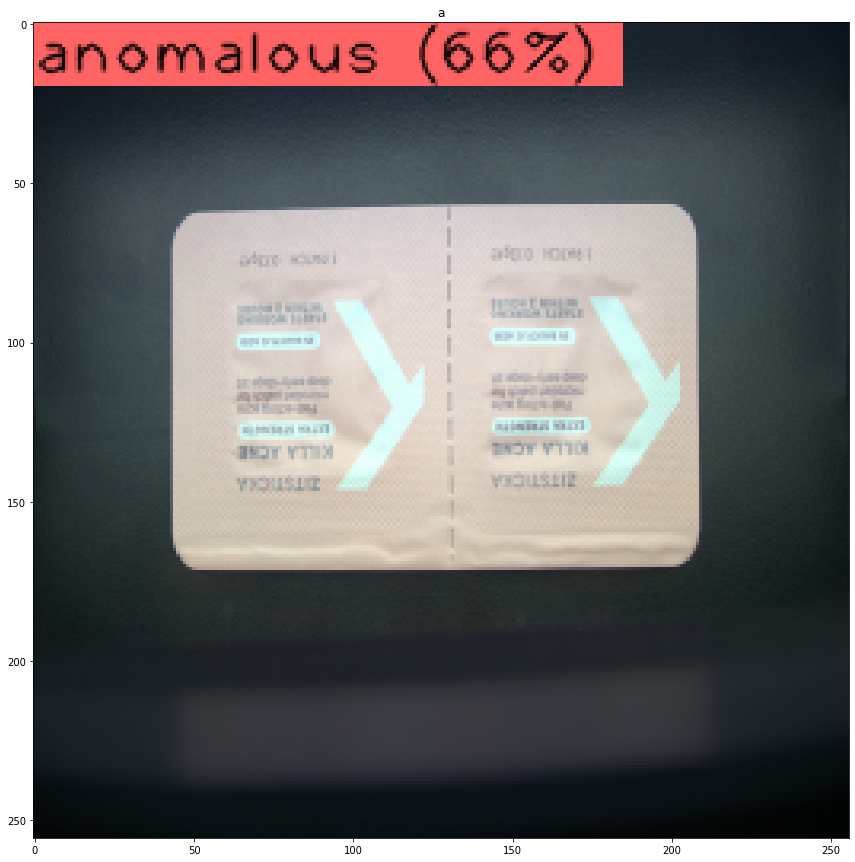

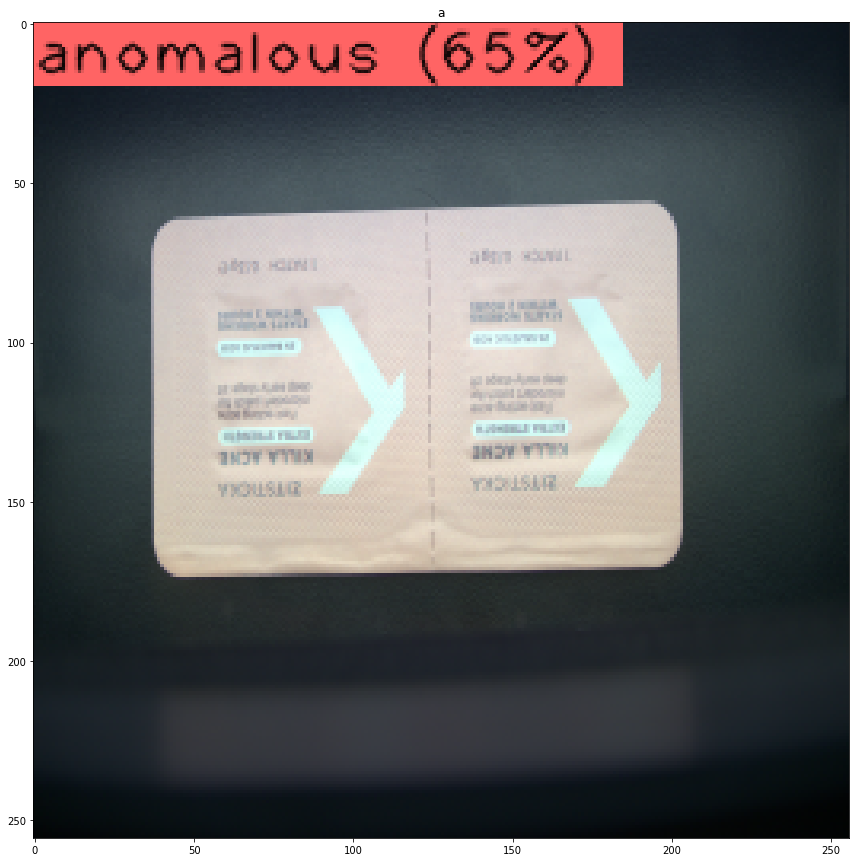

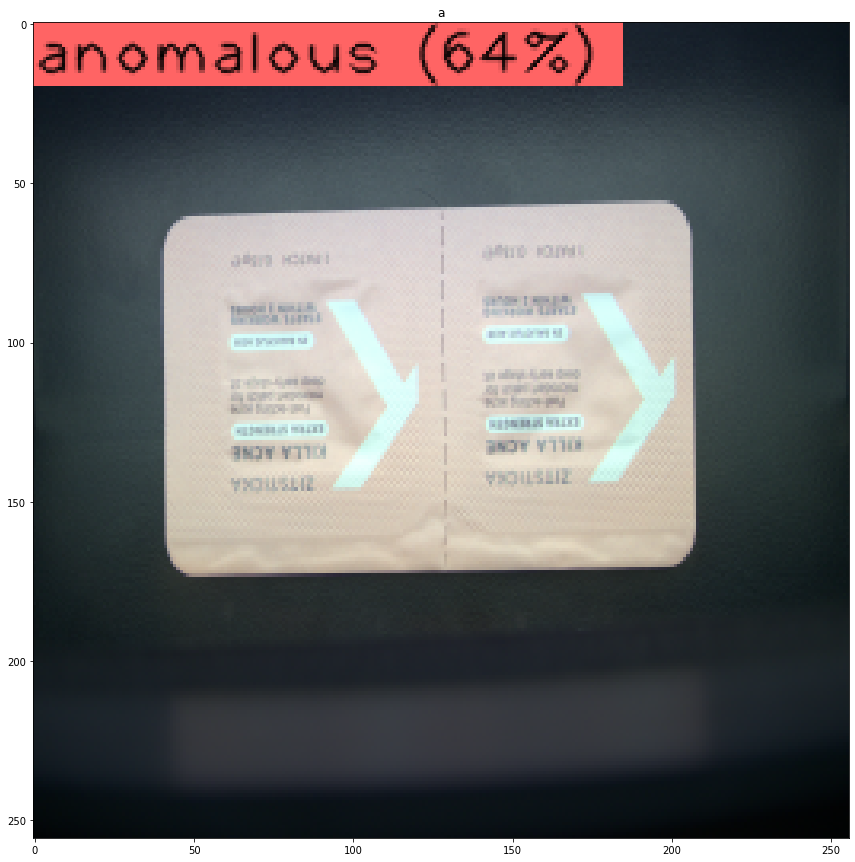

C:/Users/user/Desktop/anomaly_detection/infer_results___defect\good


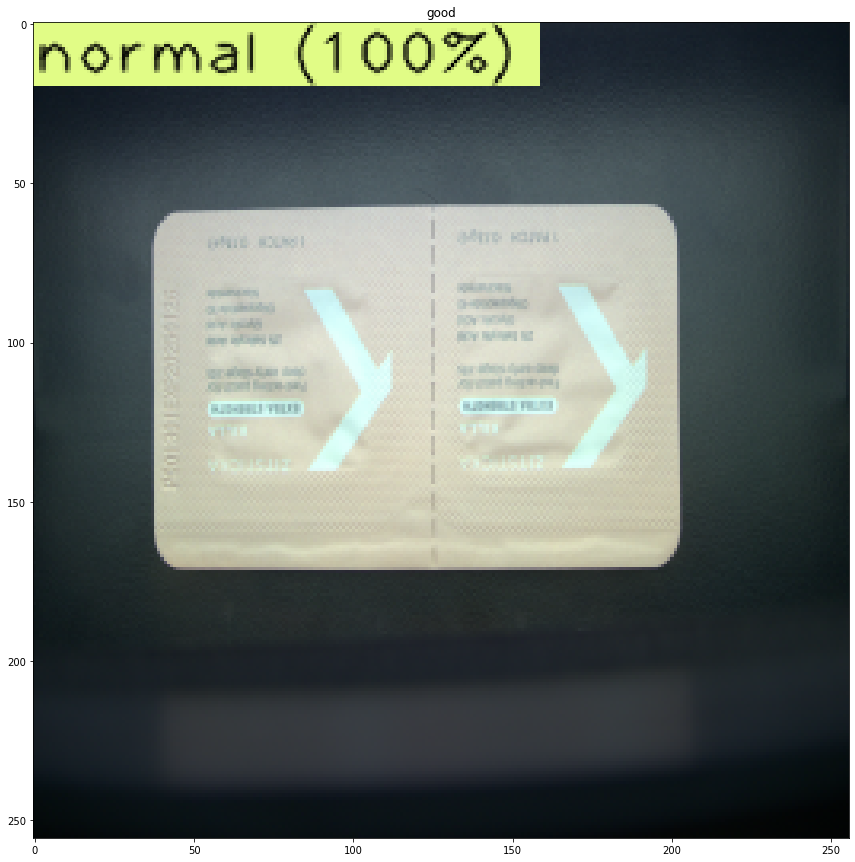

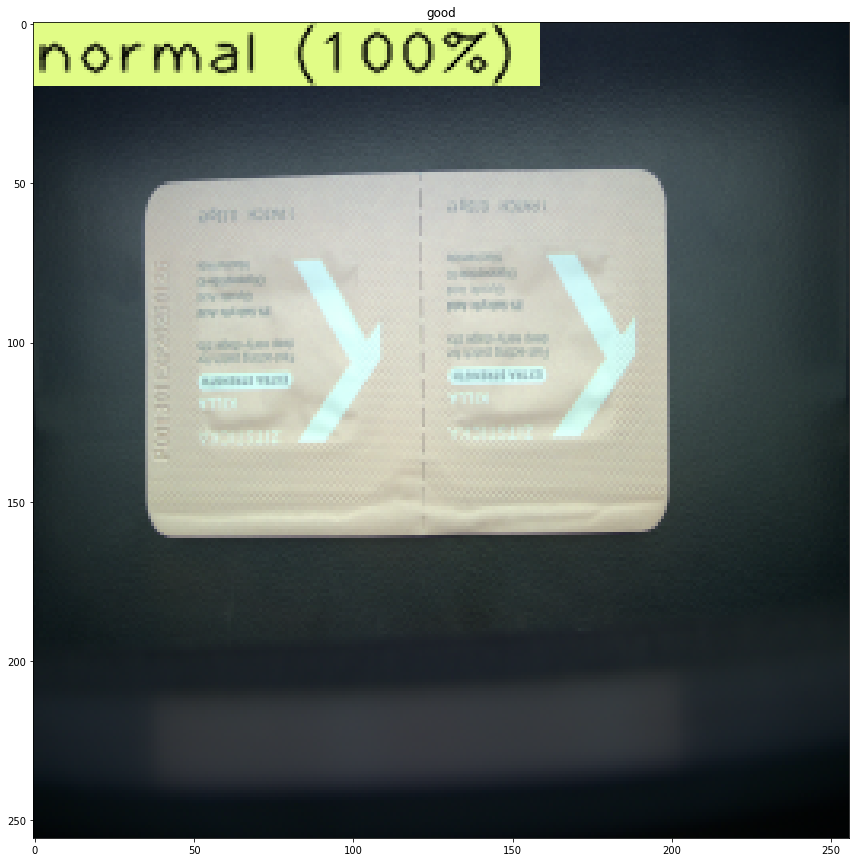

C:/Users/user/Desktop/anomaly_detection/infer_results___defect\i


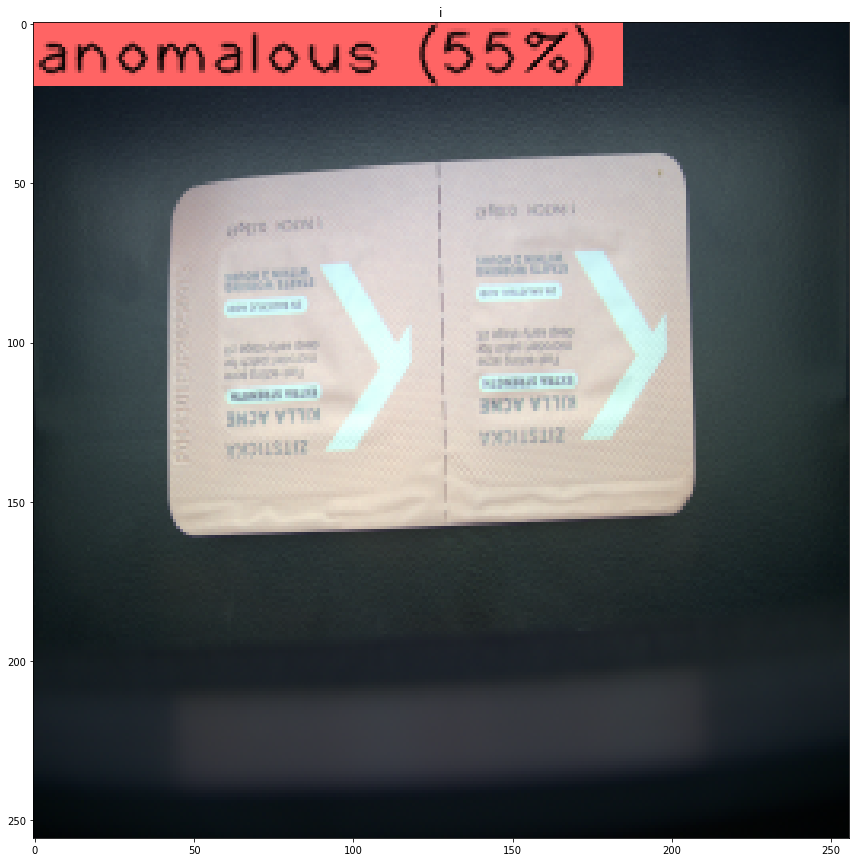

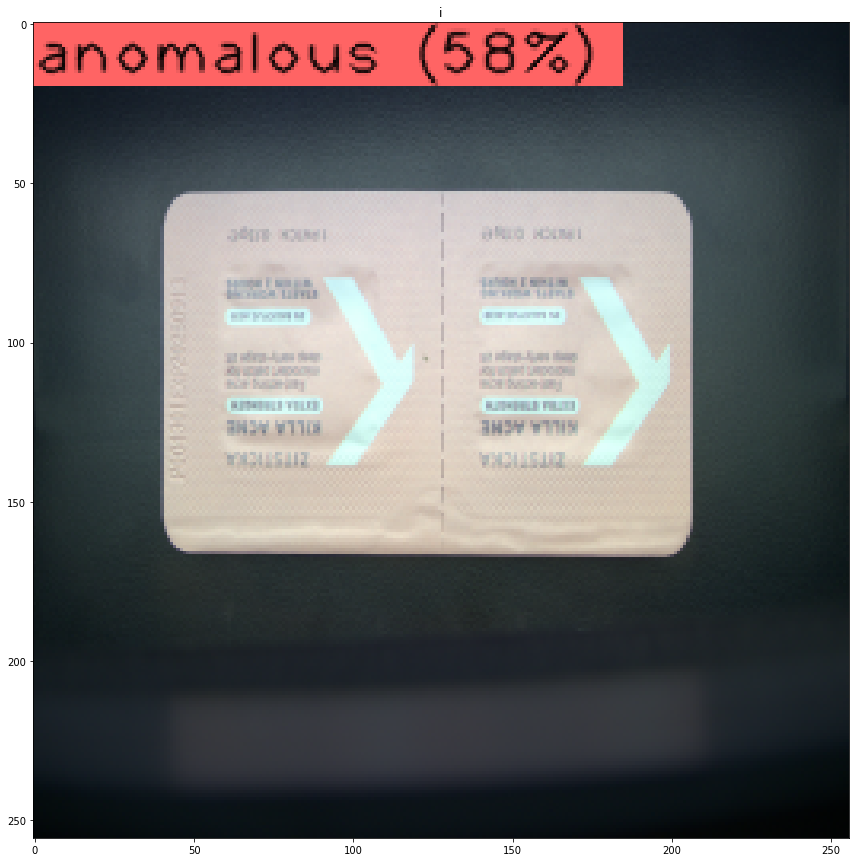

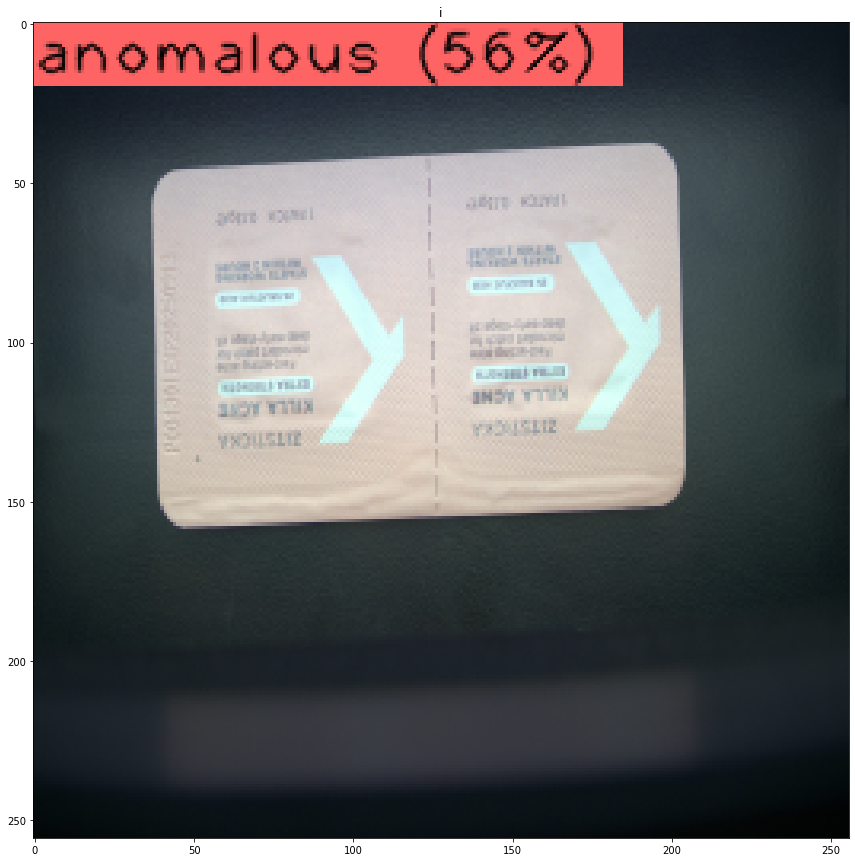

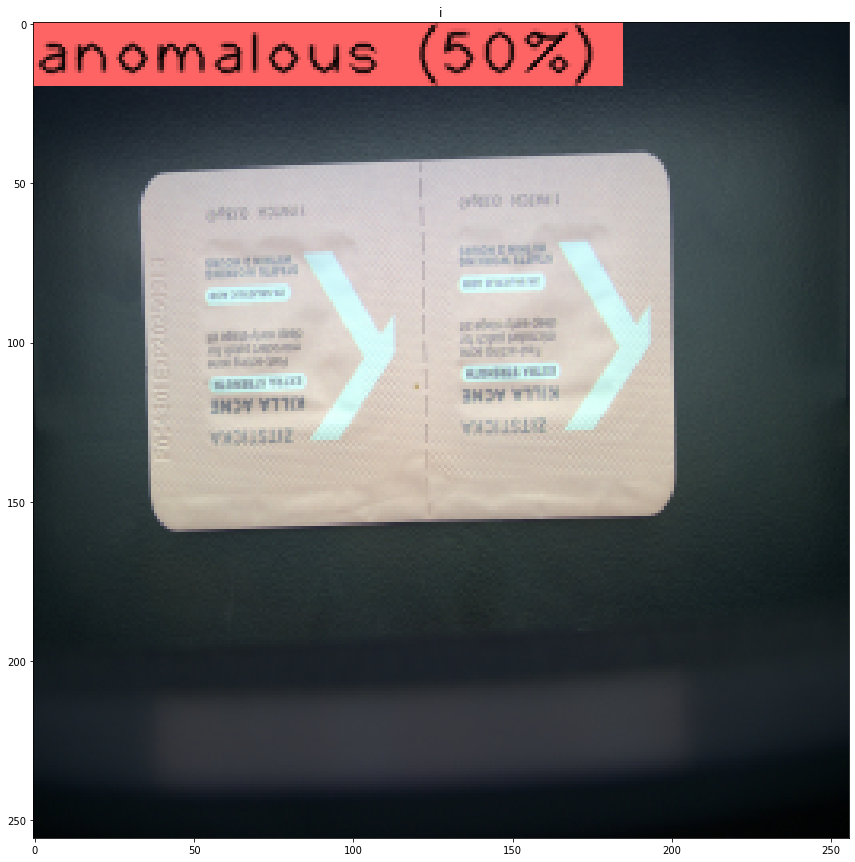

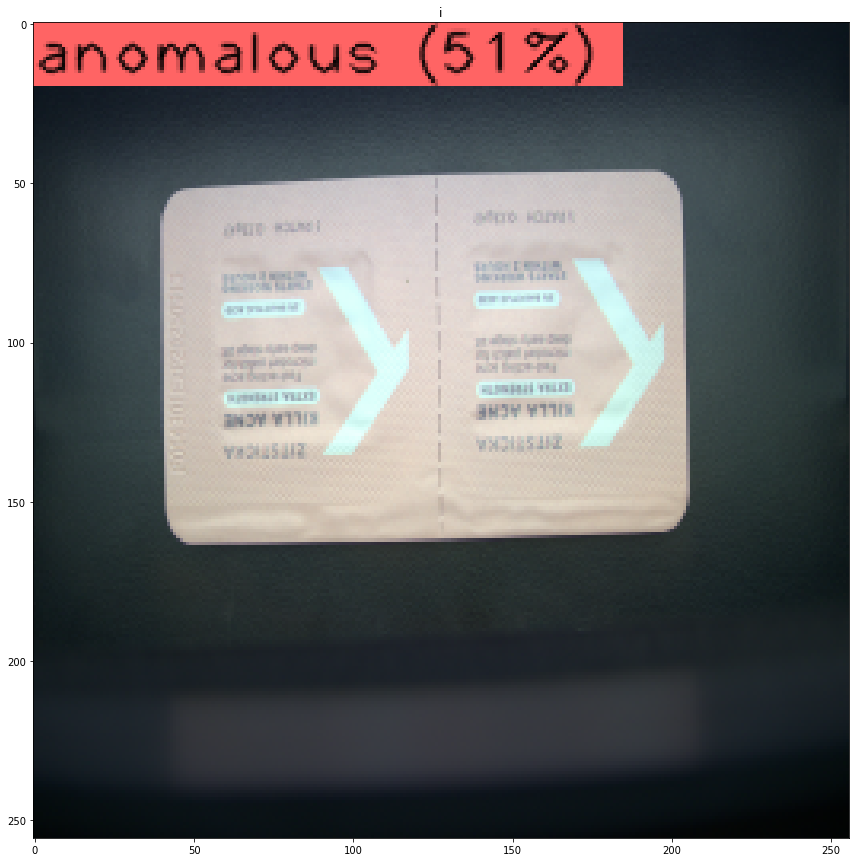

...

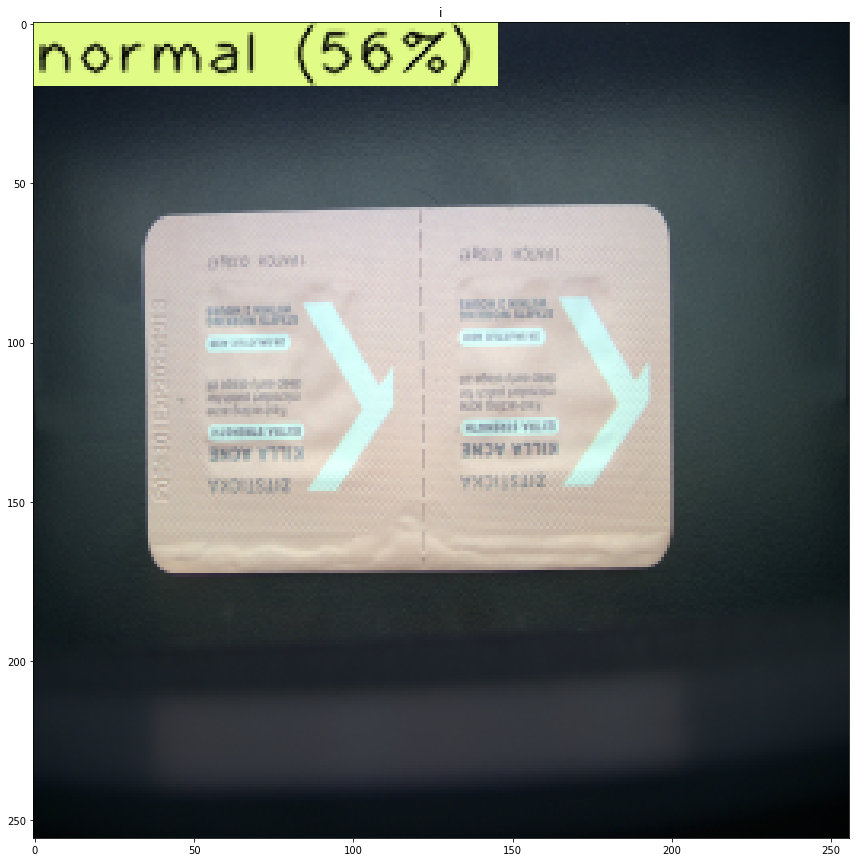

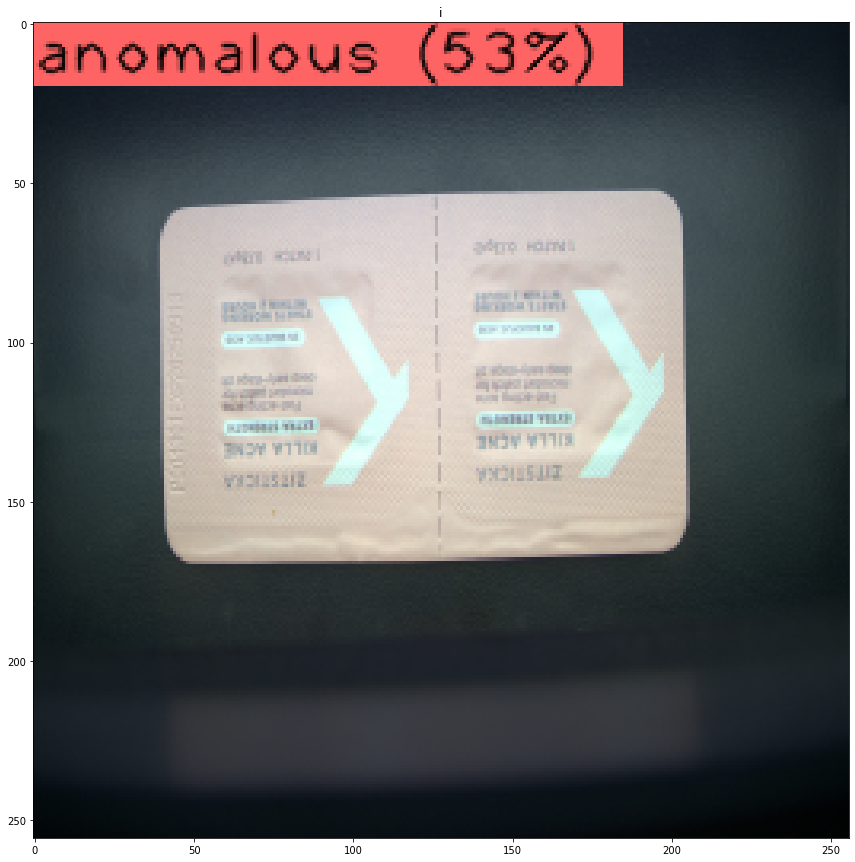

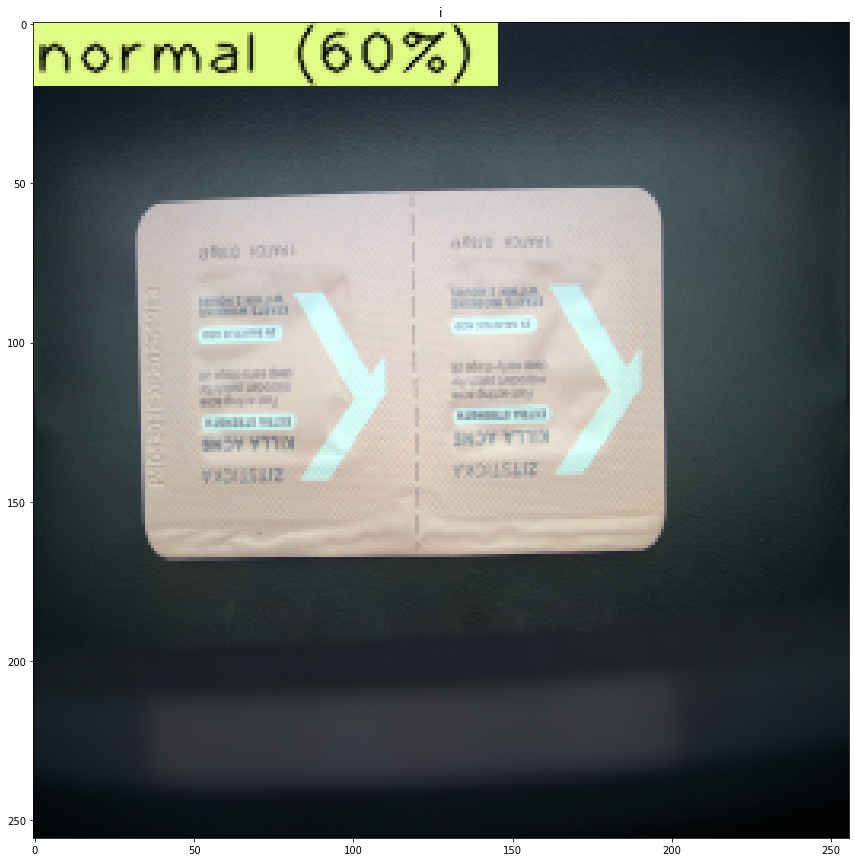

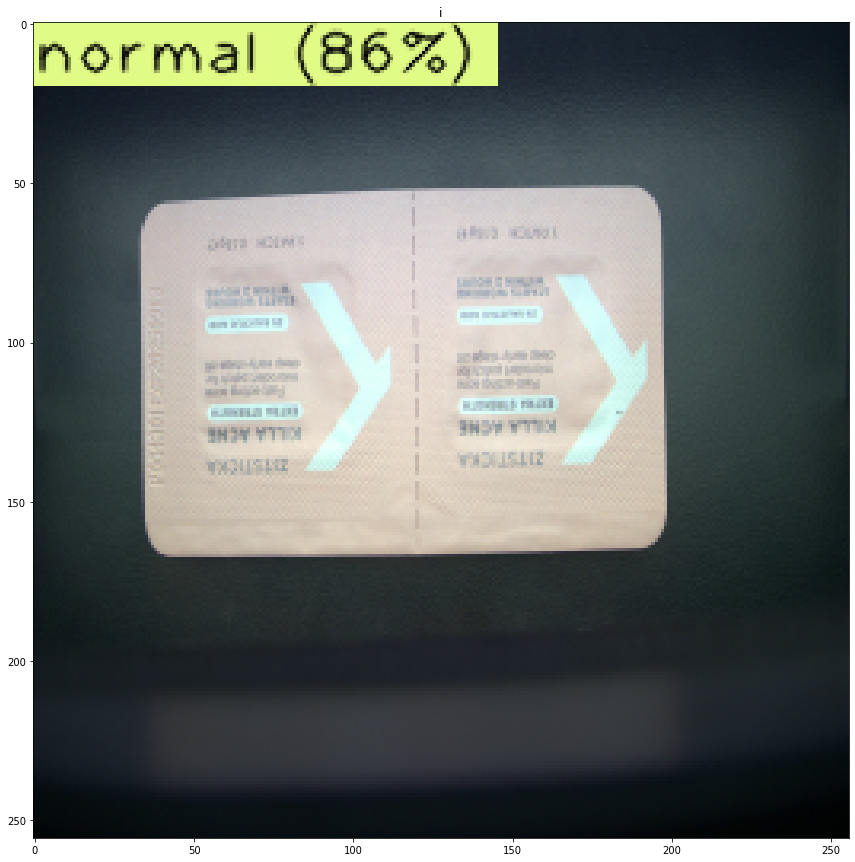

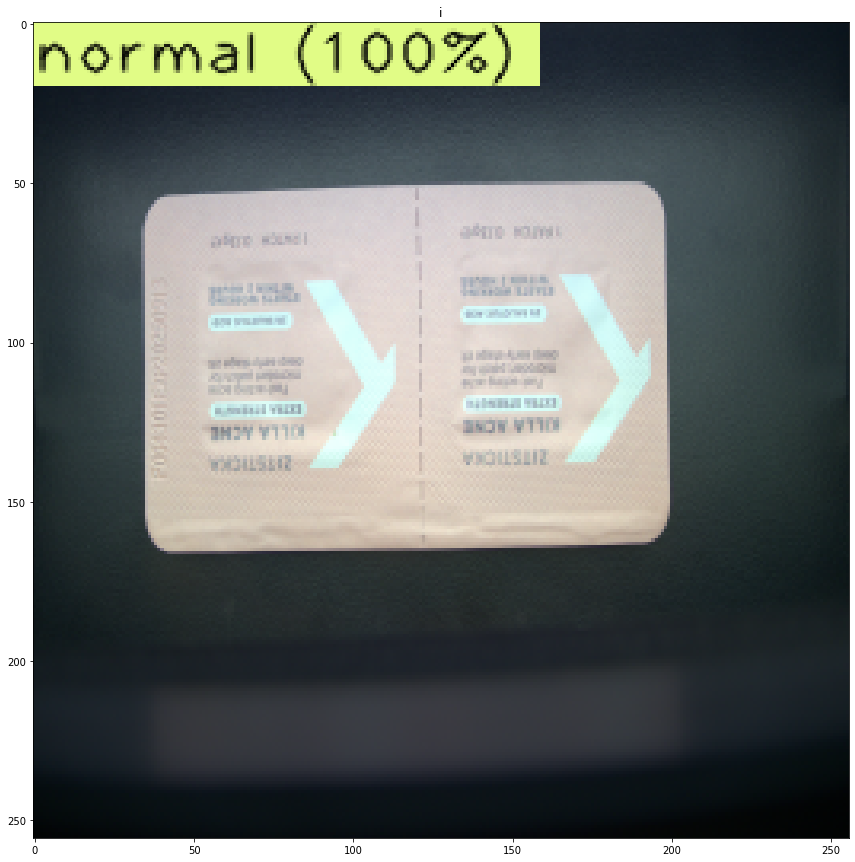

C:/Users/user/Desktop/anomaly_detection/infer_results___defect\s


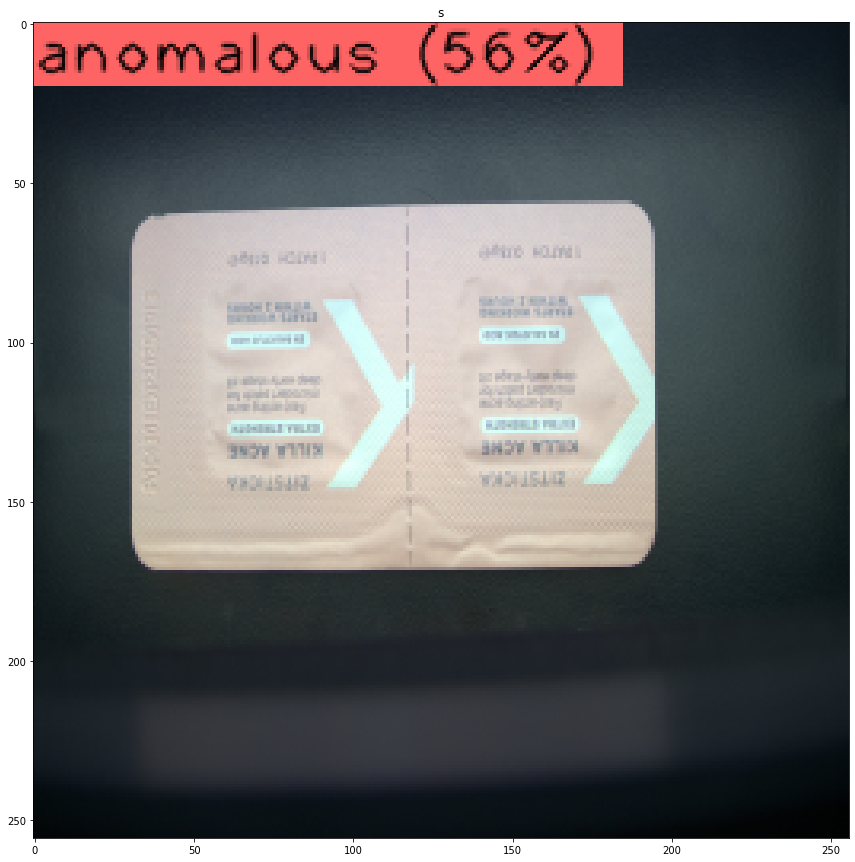

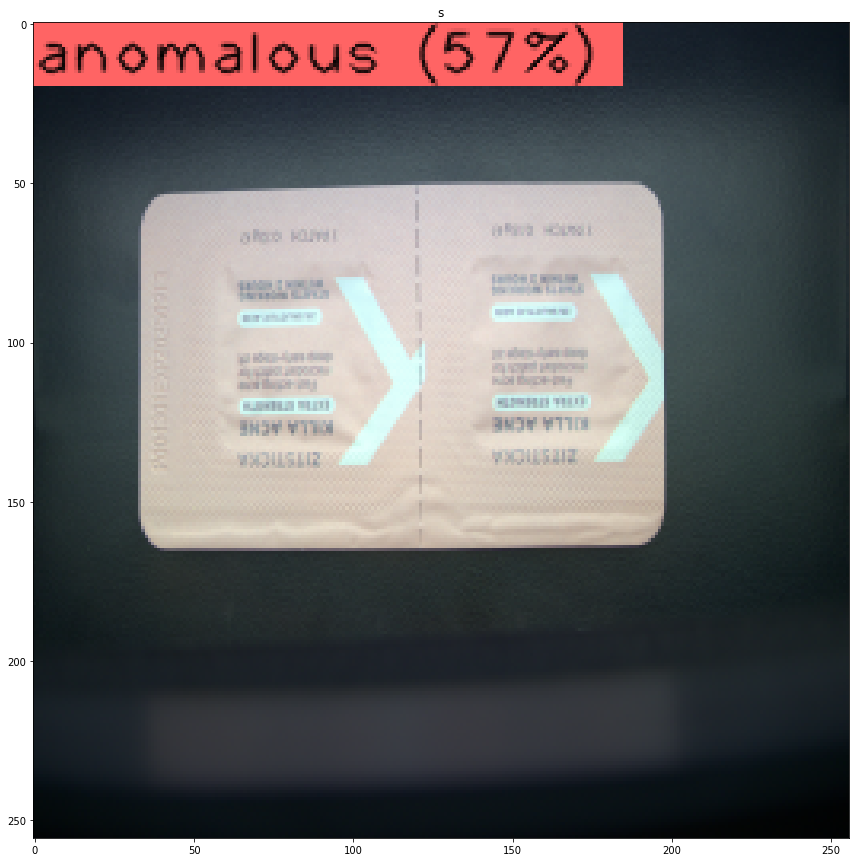

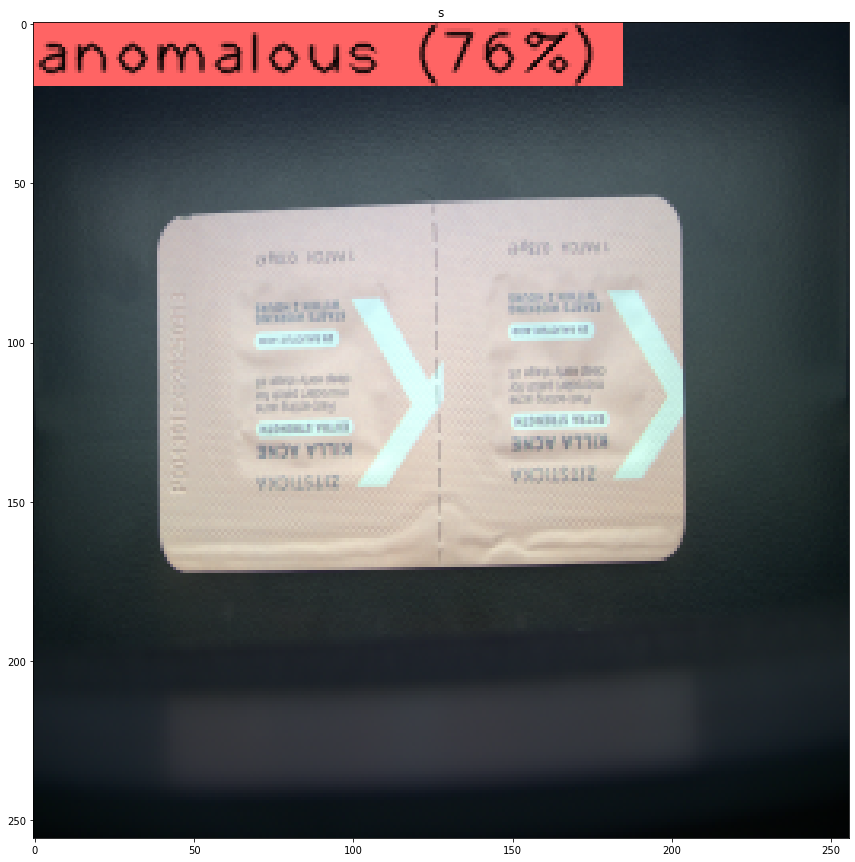

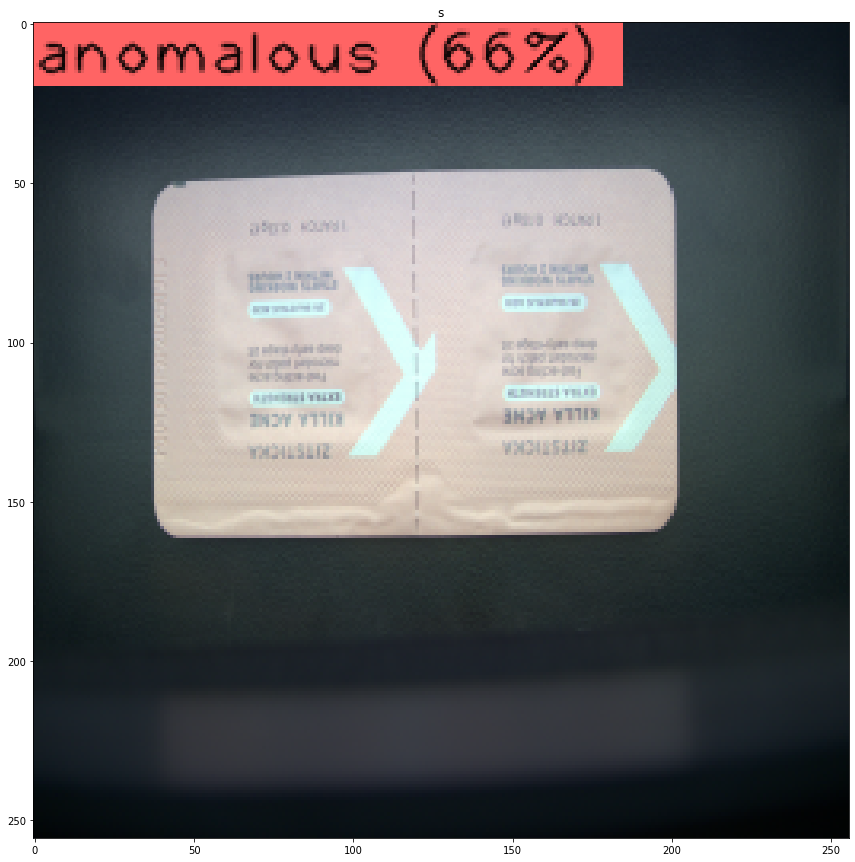

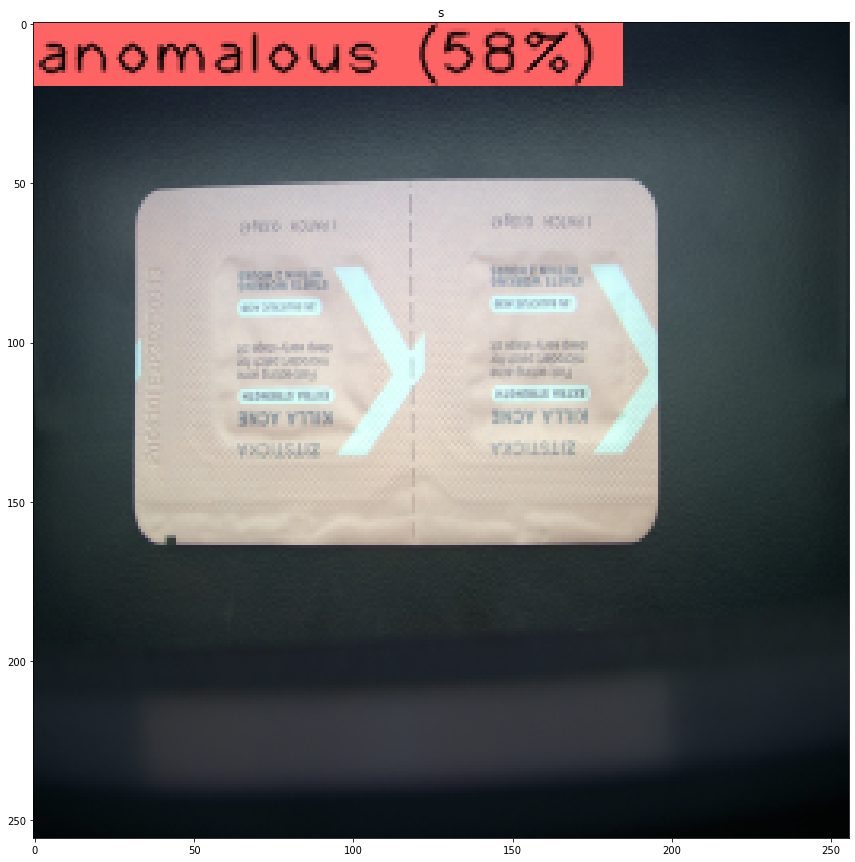

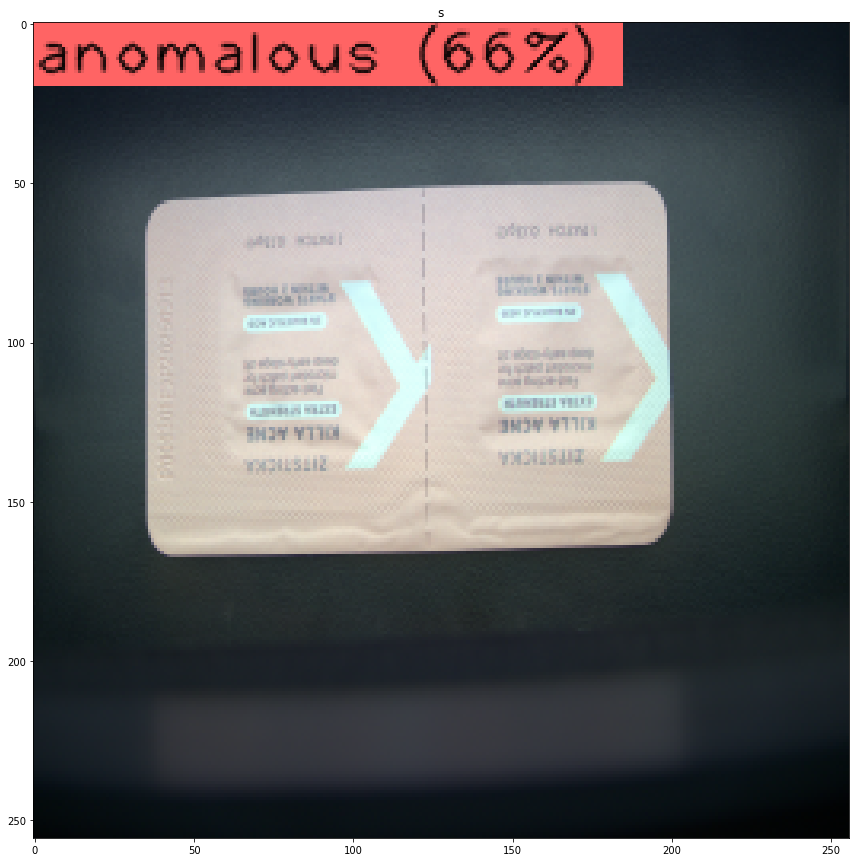

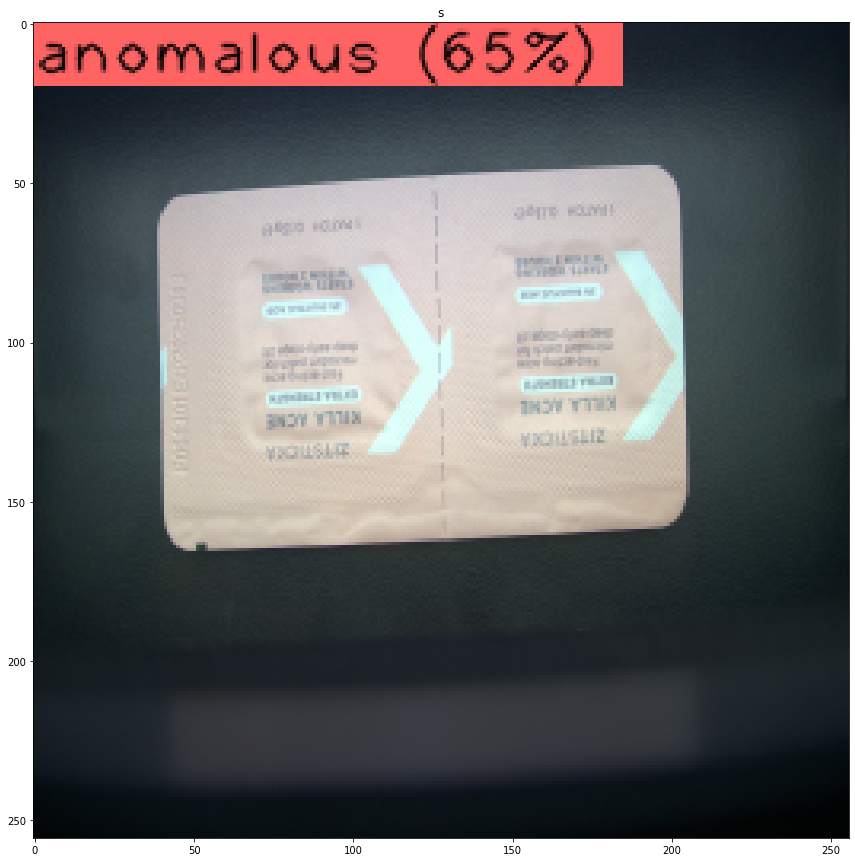

In [ ]:
for folder_category in os.listdir(infer_resutls):
    folder_category_path = os.path.join(infer_resutls, folder_category)
    print(folder_category_path)
    
    for image_file in os.listdir(folder_category_path):
        read_img = cv2.imread(os.path.join(folder_category_path, image_file))
        plt.figure(figsize=(15, 15))
        plt.imshow(read_img[:,:,::-1])
        plt.title(str(folder_category))
        plt.show()